In [1]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [2]:
np.random.seed(42)

In [3]:
cluster_generator = CorrelatedClusterGenerator(n_samples=5000,n_features=20,n_clusters=3,correlation=0.2,random_state=42)

In [4]:
X, y = cluster_generator.generate_clusters()

In [5]:
X = X + np.random.normal(scale=10,size=X.shape) 

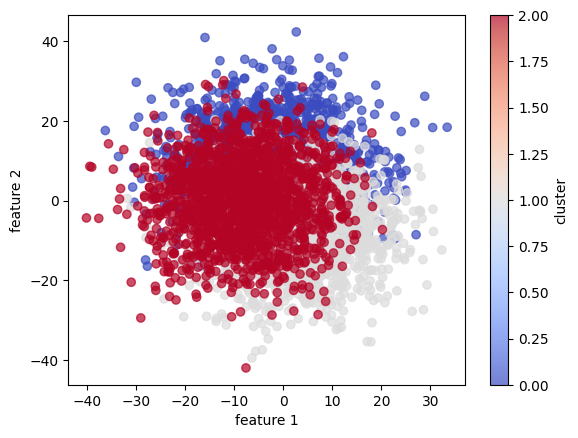

In [6]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

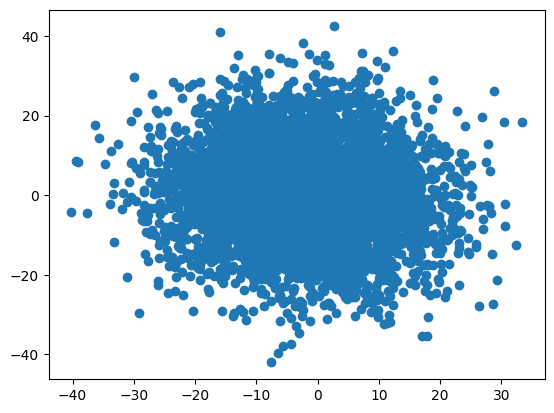

In [7]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [8]:
corr_dataset = pd.DataFrame(X) 

In [9]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [10]:
corr_dataset['target'] = y

In [11]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,0.135078,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,17.137304,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,17.768218,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.127217,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,8.491776,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,19.274278,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,-4.531186,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,13.263492,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,7.459047,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2


In [12]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [13]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.082025,0.095716,-0.162025,0.084200,0.020593,-0.022710,-0.001187,0.010633,-0.006564,-0.111459,-0.147895,-0.220018,-0.003794,0.103698,-0.045323,0.062188,-0.025276,0.168893,0.027914
vab_2,-0.082025,1.000000,0.170746,0.067672,-0.122541,-0.254663,-0.066061,0.160026,0.006749,0.262825,-0.225496,0.288484,0.259716,-0.264989,-0.290182,-0.257021,-0.005732,0.177429,-0.082508,-0.076215
vab_3,0.095716,0.170746,1.000000,-0.087880,-0.056931,-0.221510,-0.096788,0.157918,0.009734,0.216968,-0.309728,0.121190,0.011605,-0.271028,-0.178827,-0.288652,0.055807,0.163184,0.109415,-0.025085
vab_4,-0.162025,0.067672,-0.087880,1.000000,-0.047464,-0.008449,0.024933,0.002798,-0.021356,0.017111,0.132715,0.160147,0.219310,0.007383,-0.084087,0.065809,-0.047713,0.014724,-0.198070,-0.054071
vab_5,0.084200,-0.122541,-0.056931,-0.047464,1.000000,0.124685,-0.000650,-0.029197,0.017170,-0.097020,0.065430,-0.114761,-0.133337,0.109106,0.135096,0.091146,0.024683,-0.083534,0.066856,0.052082
vab_6,0.020593,-0.254663,-0.221510,-0.008449,0.124685,1.000000,0.061581,-0.143830,-0.010798,-0.259715,0.249121,-0.237024,-0.155477,0.264878,0.239333,0.252452,-0.011159,-0.179016,0.017083,0.048484
vab_7,-0.022710,-0.066061,-0.096788,0.024933,-0.000650,0.061581,1.000000,-0.023905,-0.012568,-0.066220,0.112389,-0.058616,0.002773,0.092618,0.058342,0.091755,-0.056871,-0.054838,-0.032463,0.018506
vab_8,-0.001187,0.160026,0.157918,0.002798,-0.029197,-0.143830,-0.023905,1.000000,0.003000,0.134168,-0.151470,0.115063,0.079947,-0.176325,-0.130594,-0.142995,0.015810,0.113371,0.013555,-0.038747
vab_9,0.010633,0.006749,0.009734,-0.021356,0.017170,-0.010798,-0.012568,0.003000,1.000000,0.035171,-0.024222,0.028276,-0.001562,-0.027317,-0.025875,-0.003785,-0.006492,0.021096,0.015703,0.023055
vab_10,-0.006564,0.262825,0.216968,0.017111,-0.097020,-0.259715,-0.066220,0.134168,0.035171,1.000000,-0.251734,0.224790,0.154095,-0.264343,-0.248008,-0.247031,0.020344,0.173557,-0.013480,-0.059372


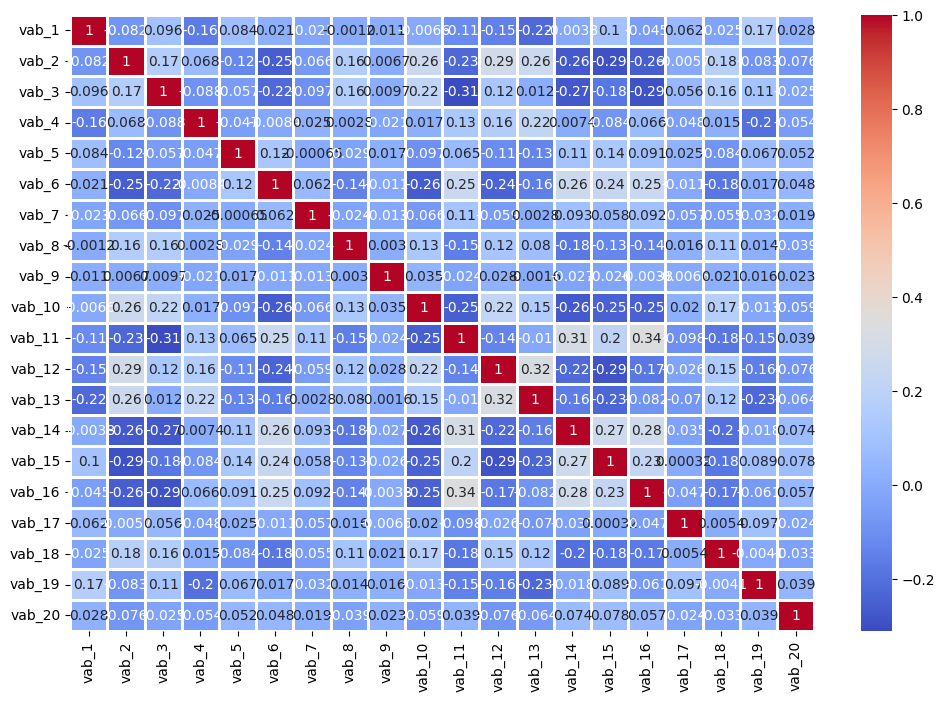

In [14]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [15]:
X_values = corr_dataset.iloc[:,:-1].values

In [16]:
y_values = corr_dataset.iloc[:,-1].values

In [17]:
scaler = StandardScaler()

In [18]:
X_values = scaler.fit_transform(X_values)

In [19]:
np.mean(X_values),np.std(X_values)

(-1.646275486214878e-16, 1.0000000000000002)

In [20]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,1.392339,0.907039,0.309734,1.164864,0.196225,-0.223208,0.959170,0.081156,0.648220,0.276475,-0.816951,-0.231304,0.607061,-0.148421,-0.833029,-0.454585,-2.261644,0.813965,-1.111121,0.809518
1,0.706719,-0.173616,0.137636,1.125359,0.971653,-0.314960,-0.812999,-1.305770,0.620910,-0.056578,-0.277306,1.167744,0.113251,-0.640438,0.382919,-0.944790,-0.625320,1.014742,-0.145695,-0.028472
2,0.890246,-0.253889,1.086878,-0.697648,-0.678881,-0.590750,-0.406391,-1.149340,1.496596,1.638721,-1.006936,1.219660,-0.107487,-1.610994,-0.581362,-1.685155,0.620239,-0.194816,-1.381436,-3.722135
3,-0.094925,0.836662,1.757946,-1.548911,0.632559,-1.013370,-0.196250,0.541042,-0.122033,-1.003812,-0.233864,1.166914,1.176811,-0.314894,-0.724947,-1.909414,0.689340,0.465246,0.209787,0.238782
4,0.048864,0.304574,-0.209170,-0.020524,1.230465,-1.628648,0.706551,1.204156,-1.745433,1.159252,-0.824647,0.456337,1.910218,0.023752,-1.465866,-0.213348,-0.846796,-0.296749,0.196982,1.095272
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-0.889286,-0.918897,0.184187,2.479497,1.509398,0.647239,0.256502,0.053165,1.466640,0.473541,0.542641,1.343588,0.201955,1.355970,-0.964661,0.985667,-0.269203,1.965532,-1.033822,-0.847836
4994,-1.002924,0.329379,-0.886555,-0.194273,-0.754803,-0.068710,0.342391,-0.417955,0.254535,-0.538139,1.506959,-0.615274,1.628387,1.051905,-0.356921,0.430472,-0.986709,0.029432,-0.714967,-0.092851
4995,-1.277770,0.805168,1.260894,-0.372346,0.011485,-0.029671,-0.513189,-1.166451,0.141959,0.635381,0.295658,0.848983,2.237372,1.784781,-0.307007,1.822744,-1.583795,-0.301410,-0.941894,-0.870488
4996,0.380971,0.944456,-0.080500,-0.265227,2.231192,1.912382,0.377581,0.113839,1.204080,-0.823514,1.677569,0.371357,-0.310859,-0.869744,0.352966,-0.469619,0.249944,0.956449,-0.339466,-1.899931


<Axes: ylabel='Density'>

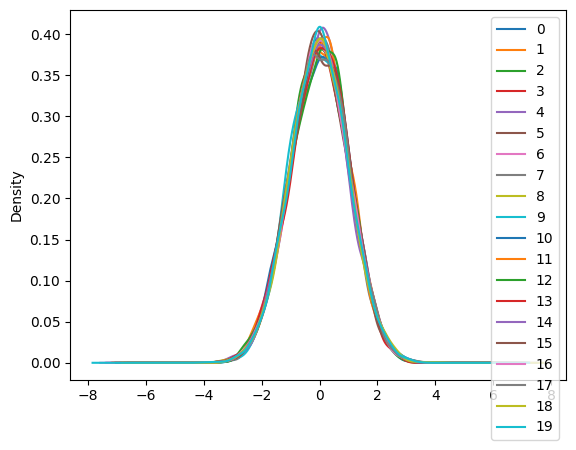

In [21]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [22]:
pca_general = PCA()

In [23]:
pca_general.fit(X_values)

PCA()

In [24]:
explained_variance = pca_general.explained_variance_ratio_

In [25]:
explained_variance

array([0.16957604, 0.09851381, 0.05213599, 0.0507816 , 0.04809016,
       0.04797817, 0.04647299, 0.04444431, 0.04322941, 0.04194684,
       0.03988264, 0.0382623 , 0.03776337, 0.03696534, 0.03593711,
       0.03555456, 0.03492575, 0.03362066, 0.03260287, 0.03131608])

In [26]:
eigenvalues = pca_general.explained_variance_

In [27]:
pd.DataFrame(eigenvalues)

,0
0,3.392200
1,1.970671
2,1.042928
3,1.015835
4,0.961996
5,0.959755
6,0.929646
7,0.889064
8,0.864761
9,0.839105


In [28]:
eigenvectors = pca_general.components_

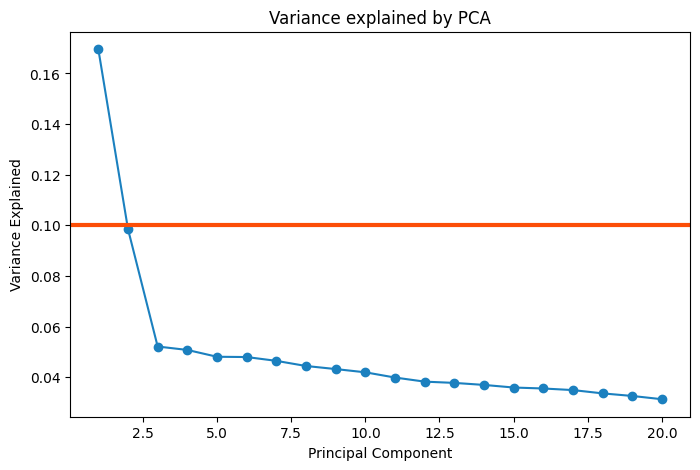

In [29]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [30]:
pca = PCA(n_components=2)

In [31]:
principal_components = pca.fit_transform(X_values)

In [32]:
pd.DataFrame(principal_components).head(8)

,0,1
0,-1.265920,-0.730381
1,-0.817263,-0.084051
2,-2.944756,0.658502
3,-2.369763,0.955424
4,-1.944064,-0.620560
5,-1.319496,0.162179
6,-2.246045,-0.750834
7,-0.184819,-0.724529


In [33]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2'])

In [34]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [35]:
final_df

,principal component 1,principal component 2,target
0,-1.265920,-0.730381,0
1,-0.817263,-0.084051,0
2,-2.944756,0.658502,0
3,-2.369763,0.955424,0
4,-1.944064,-0.620560,0
...,...,...,...
4993,-0.013633,-2.463642,2
4994,0.835642,-2.400535,2
4995,-0.268758,-2.538196,2
4996,0.618317,-0.146089,2


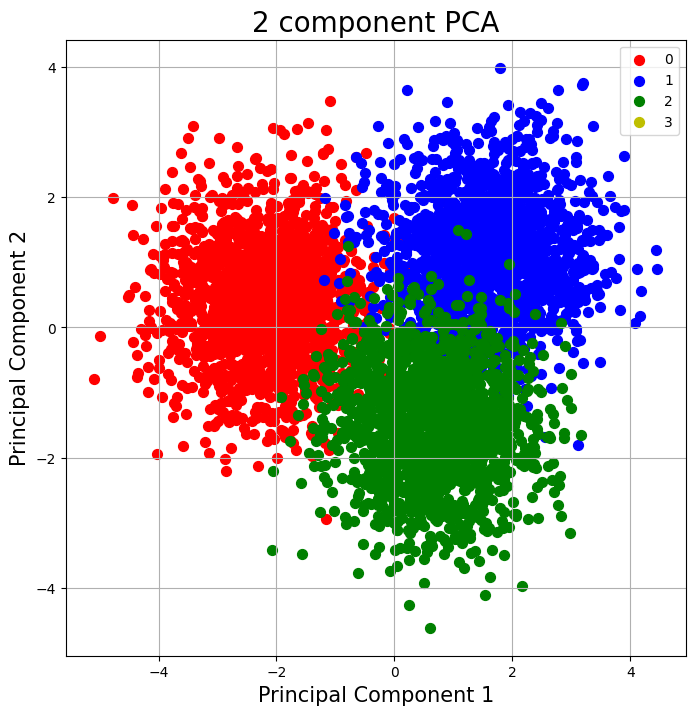

In [36]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

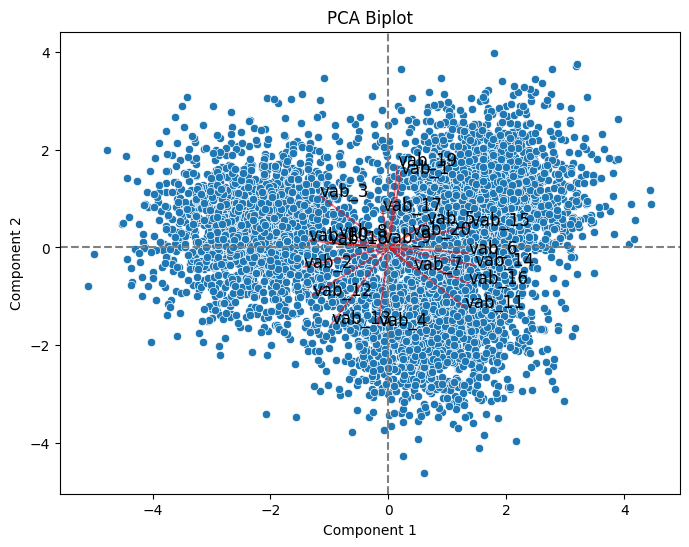

In [37]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

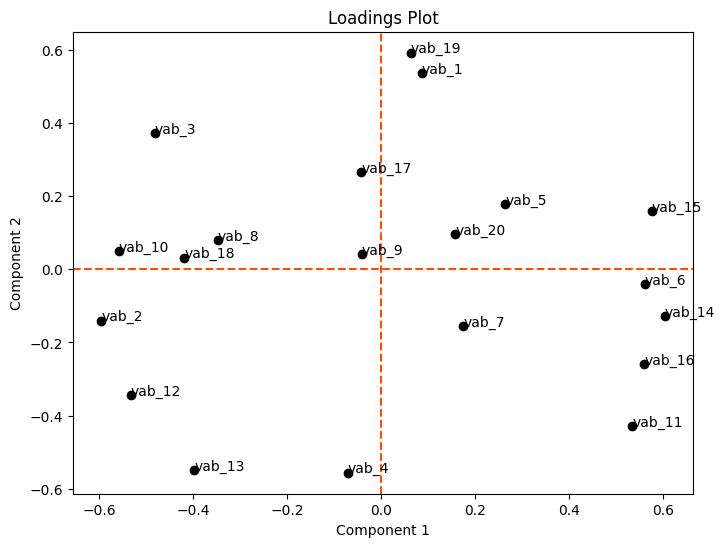

In [38]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [39]:
X_pca = pca.transform(X_values)

In [40]:
pd.DataFrame(X_pca).head()

,0,1
0,-1.265920,-0.730381
1,-0.817263,-0.084051
2,-2.944756,0.658502
3,-2.369763,0.955424
4,-1.944064,-0.620560


## t-SNE

In [41]:
tsne = TSNE(n_components=2,random_state=42)

In [42]:
X_tsne = tsne.fit_transform(X_values)

In [43]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [44]:
tsne_data

,dim_1,dim_2,target
0,-28.145845,5.486068,0
1,-39.484066,-17.283037,0
2,-61.935059,17.910641,0
3,-44.916157,11.094526,0
4,-28.068573,-4.456182,0
...,...,...,...
4993,-5.295067,8.945759,2
4994,2.859269,16.591412,2
4995,-14.695715,13.502672,2
4996,-21.196667,-19.571259,2


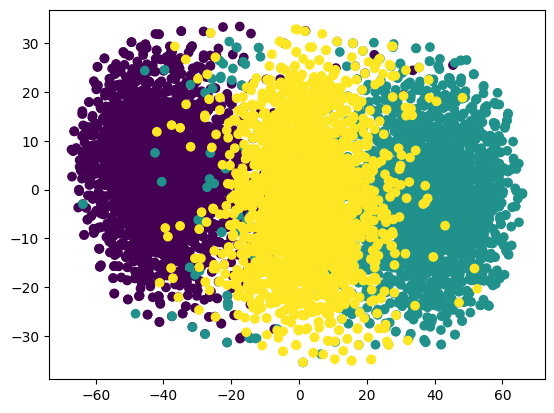

In [45]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [46]:
tsne.kl_divergence_

3.153815269470215

## umap

In [47]:
umap = umap.UMAP(random_state=42)

In [48]:
X_umap = umap.fit_transform(X_values)

In [49]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [50]:
umap_data

,dim_1,dim_2,target
0,8.063560,6.350025,0
1,7.638290,5.308659,0
2,9.898536,5.546534,0
3,9.040417,5.670213,0
4,7.456507,6.095011,0
...,...,...,...
4993,4.636513,5.733647,2
4994,4.127621,6.393054,2
4995,4.892410,5.544544,2
4996,5.574959,5.838945,2


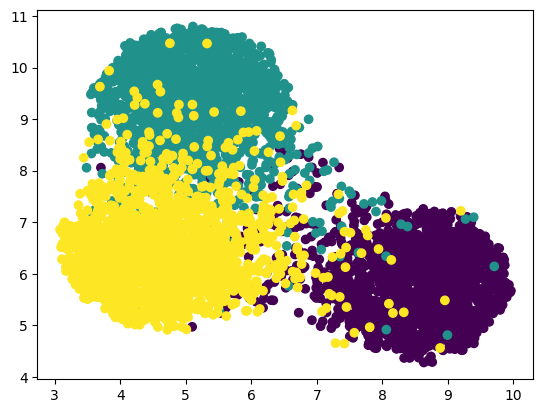

In [51]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [52]:
kmeans = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [53]:
kmeans.fit(X_values)

KMeans(n_clusters=3, random_state=42)

In [54]:
df_kmeans = corr_dataset.copy()

In [55]:
df_kmeans['k_means'] = kmeans.labels_

In [56]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,2
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,2
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,2
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,2
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,1
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,1
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,1
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,1


In [57]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.027410964385754303
accuracy after: 0.9427771108443377


In [58]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


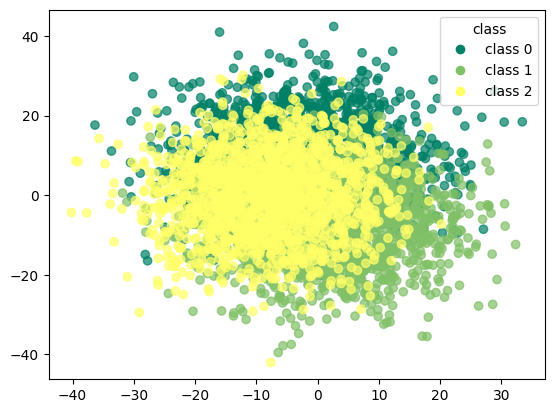

In [59]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

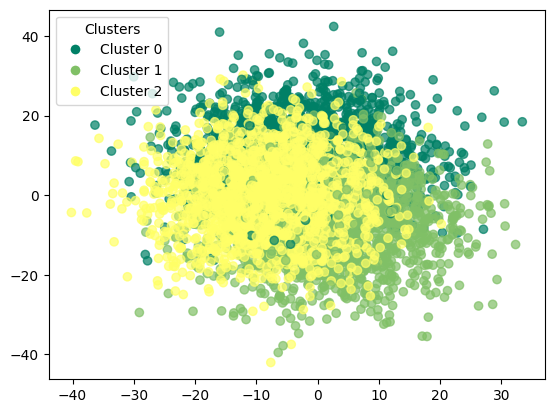

In [60]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [61]:
kmeans.cluster_centers_

array([[ 0.47645967, -0.64458347, -0.12769525, -0.49976714,  0.35625378,
         0.45188919,  0.01330222, -0.23483773, -0.00530743, -0.44883571,
         0.12128295, -0.75733796, -0.86036732,  0.44090279,  0.63996226,
         0.26711685,  0.15875831, -0.33073444,  0.51570069,  0.20802766],
       [-0.52095357, -0.05830536, -0.55891437,  0.56317862, -0.10040574,
         0.22993116,  0.23000634, -0.20581649, -0.0293512 , -0.25110335,
         0.7096199 ,  0.19701524,  0.52861062,  0.35402365,  0.01622216,
         0.50082899, -0.28073732, -0.16705582, -0.60584609, -0.07432313],
       [ 0.03298908,  0.68967465,  0.66334876, -0.0507125 , -0.25354669,
        -0.66542648, -0.23440687,  0.428879  ,  0.03346099,  0.6827989 ,
        -0.80206792,  0.55481074,  0.33698972, -0.77404035, -0.64463632,
        -0.74449301,  0.11410441,  0.48583806,  0.07610955, -0.13295254]])

In [62]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1620   15   31]
 [  28 1565   73]
 [  49   90 1527]]


In [63]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1666
           1       0.94      0.94      0.94      1666
           2       0.94      0.92      0.93      1666

    accuracy                           0.94      4998
   macro avg       0.94      0.94      0.94      4998
weighted avg       0.94      0.94      0.94      4998



### k-means with pca

In [64]:
kmeans_pca = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [65]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=3, random_state=42)

In [66]:
df_pca_kmeans = corr_dataset.copy()

In [67]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [68]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,2
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,2
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,2
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,2
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,1
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,1
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,1
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,1


In [69]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.028011204481792718
accuracy after: 0.9411764705882353


In [70]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


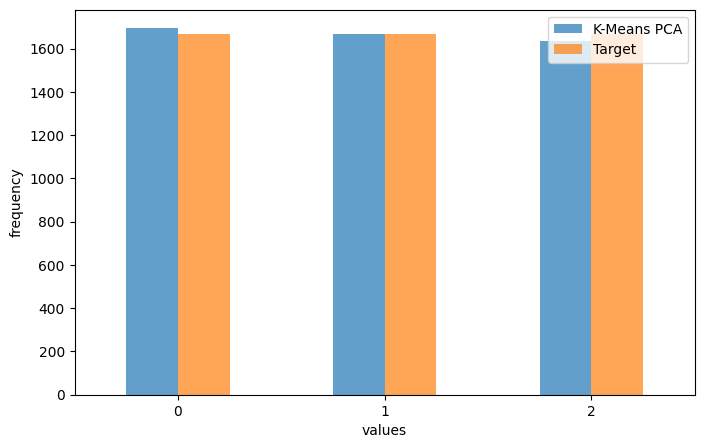

In [71]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [72]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1620   14   32]
 [  28 1559   79]
 [  47   94 1525]]


In [73]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1666
           1       0.94      0.94      0.94      1666
           2       0.93      0.92      0.92      1666

    accuracy                           0.94      4998
   macro avg       0.94      0.94      0.94      4998
weighted avg       0.94      0.94      0.94      4998



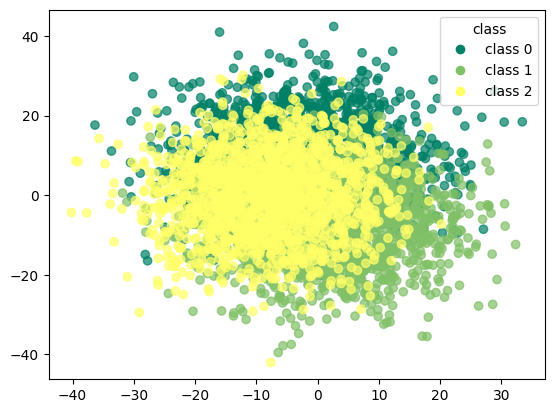

In [74]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

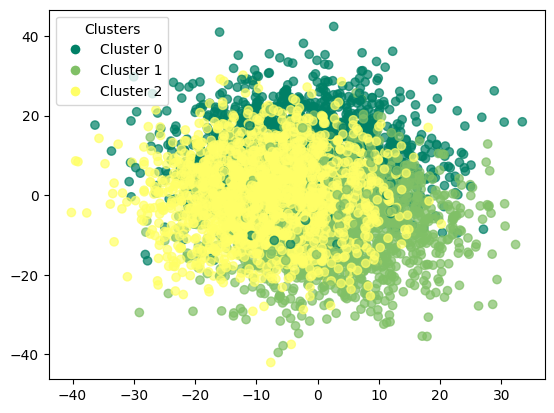

In [75]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

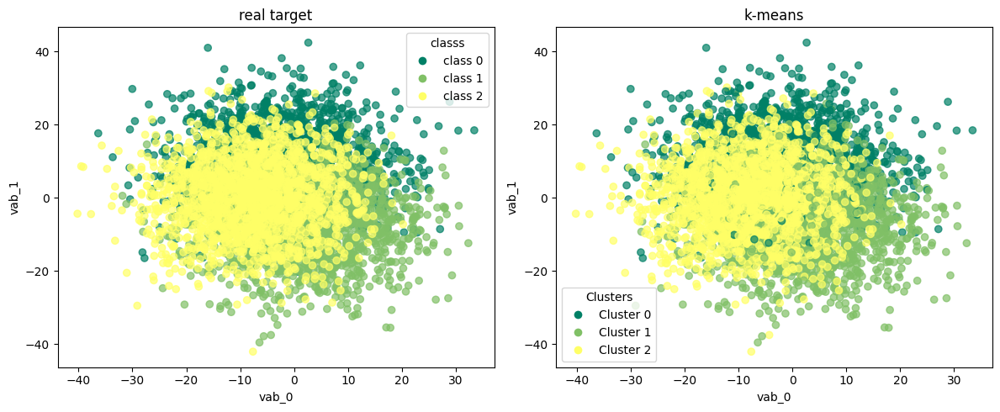

In [76]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

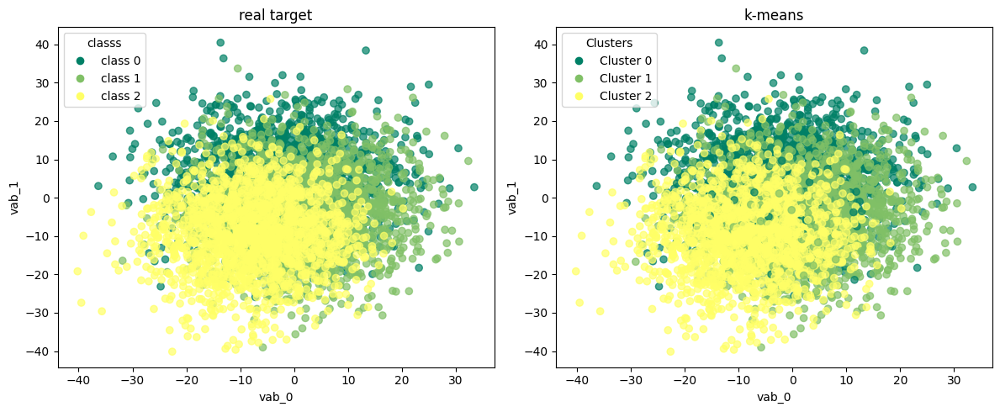

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

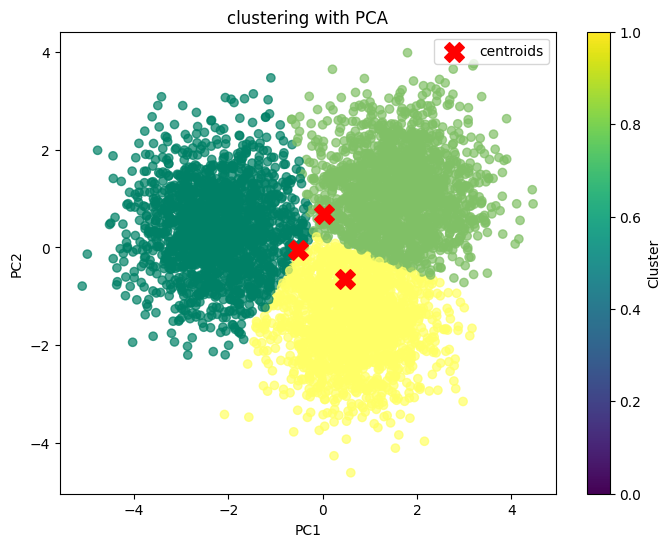

In [78]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

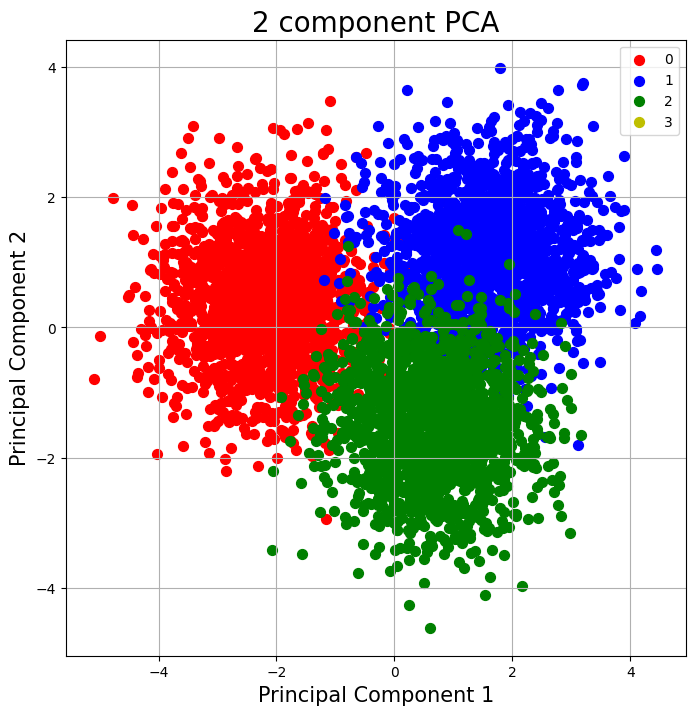

In [79]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [80]:
kmeans_tsne = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [81]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=3, random_state=42)

In [82]:
df_tsne_kmeans = corr_dataset.copy()

In [83]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [84]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,1
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,1
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,1
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,1
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


In [85]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.3033213285314126
accuracy after: 0.9041616646658663


In [86]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


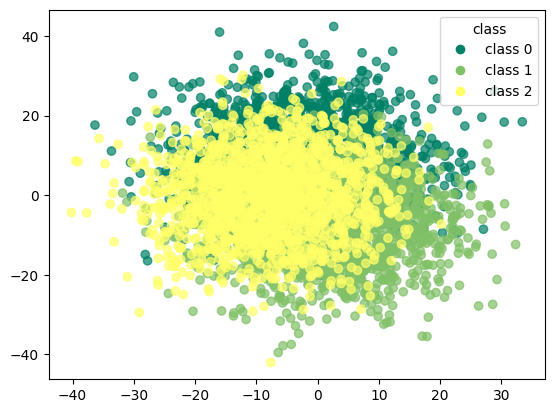

In [87]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

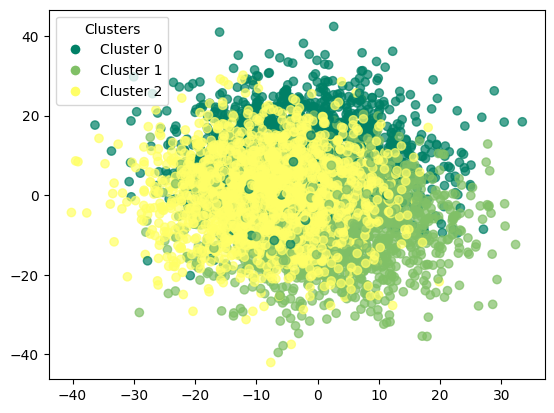

In [88]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

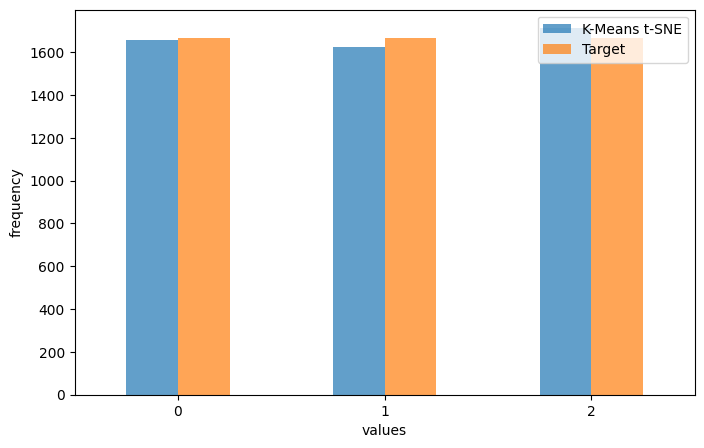

In [89]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [90]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1564    8   94]
 [  36 1483  147]
 [  59  135 1472]]


In [91]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1666
           1       0.91      0.89      0.90      1666
           2       0.86      0.88      0.87      1666

    accuracy                           0.90      4998
   macro avg       0.90      0.90      0.90      4998
weighted avg       0.90      0.90      0.90      4998



### k-means with umap

In [92]:
kmeans_umap = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [93]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=3, random_state=42)

In [94]:
df_umap_kmeans = corr_dataset.copy()

In [95]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [96]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,1
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,1
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,1
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,1
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


In [97]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.31472589035614246
accuracy after: 0.9295718287314926


In [98]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


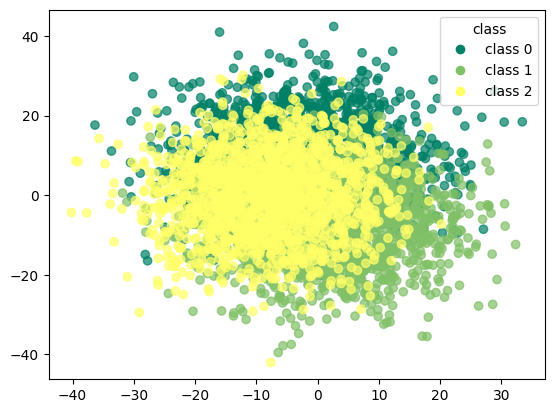

In [99]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

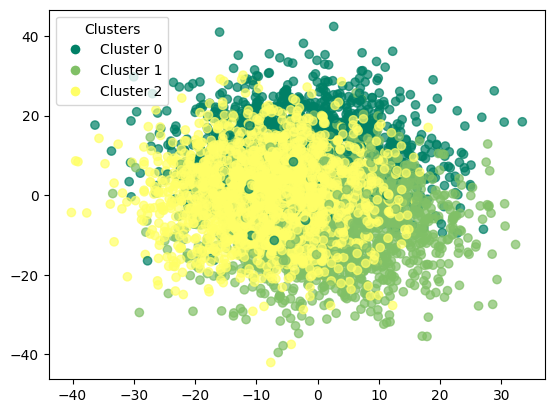

In [100]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

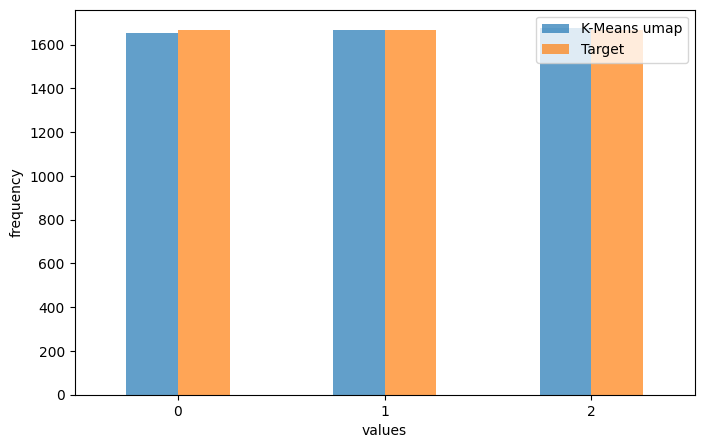

In [101]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [102]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1582   24   60]
 [  28 1543   95]
 [  45  100 1521]]


In [103]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.96      0.95      0.95      1666
           1       0.93      0.93      0.93      1666
           2       0.91      0.91      0.91      1666

    accuracy                           0.93      4998
   macro avg       0.93      0.93      0.93      4998
weighted avg       0.93      0.93      0.93      4998



## trimmed k-means

In [104]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [105]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=3,trim_fraction=0.1)

In [106]:
trimmed_kmeans

KMeans(n_clusters=3, random_state=42)

In [107]:
df_trim_kmeans = corr_dataset.copy()

In [108]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [109]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [110]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,2
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,2
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,2
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,2
5,-15.000836,4.840861,15.945320,-6.485857,-6.189127,-10.250297,4.107853,10.769119,-0.139978,-3.584421,...,4.139756,-0.788152,2.782174,-20.417977,-4.088289,-8.929520,-4.608089,9.146845,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,1
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,1
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,1
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,1


In [111]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.026233881725211204
accuracy after: 0.944642063139173


In [112]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
5,-15.000836,4.840861,15.945320,-6.485857,-6.189127,-10.250297,4.107853,10.769119,-0.139978,-3.584421,...,4.139756,-0.788152,2.782174,-20.417977,-4.088289,-8.929520,-4.608089,9.146845,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


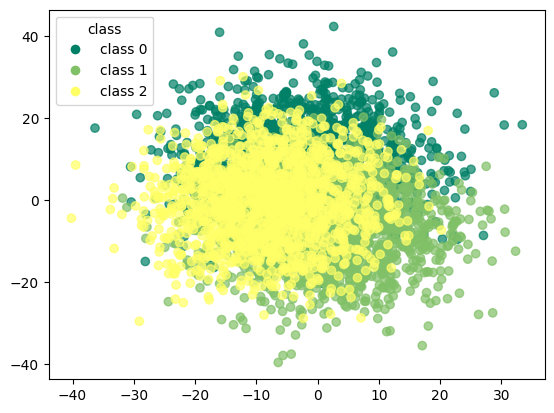

In [113]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

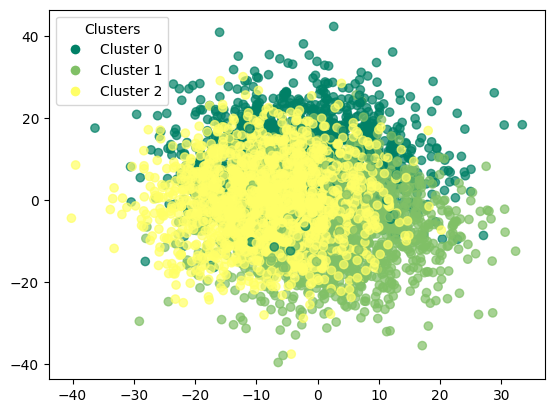

In [114]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [115]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1446   13   25]
 [  21 1423   61]
 [  44   85 1380]]


In [116]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1484
           1       0.94      0.95      0.94      1505
           2       0.94      0.91      0.93      1509

    accuracy                           0.94      4498
   macro avg       0.94      0.94      0.94      4498
weighted avg       0.94      0.94      0.94      4498



### trimmed k-means with pca

In [117]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=3,trim_fraction=0.1)

In [118]:
trim_kmeans_pca

KMeans(n_clusters=3, random_state=42)

In [119]:
df_pca_trim_kmeans = corr_dataset.copy()

In [120]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [121]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [122]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,1
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,1
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,1
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,1
5,-15.000836,4.840861,15.945320,-6.485857,-6.189127,-10.250297,4.107853,10.769119,-0.139978,-3.584421,...,4.139756,-0.788152,2.782174,-20.417977,-4.088289,-8.929520,-4.608089,9.146845,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


In [123]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.31547354379724324
accuracy after: 0.9388617163183637


In [124]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
5,-15.000836,4.840861,15.945320,-6.485857,-6.189127,-10.250297,4.107853,10.769119,-0.139978,-3.584421,...,4.139756,-0.788152,2.782174,-20.417977,-4.088289,-8.929520,-4.608089,9.146845,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


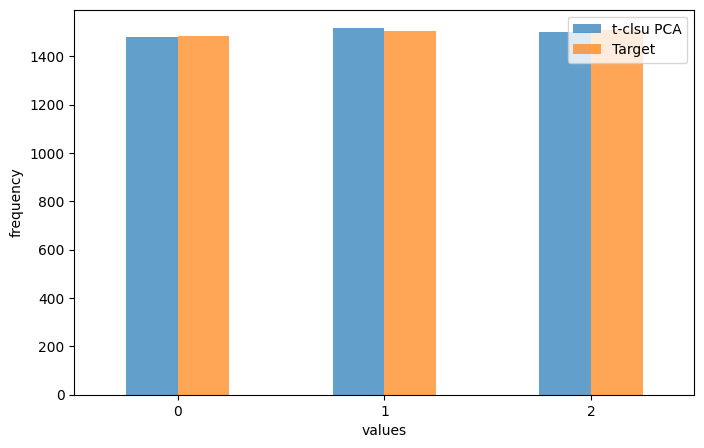

In [125]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [126]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1434   26   24]
 [   9 1405   91]
 [  39   86 1384]]


In [127]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1484
           1       0.93      0.93      0.93      1505
           2       0.92      0.92      0.92      1509

    accuracy                           0.94      4498
   macro avg       0.94      0.94      0.94      4498
weighted avg       0.94      0.94      0.94      4498



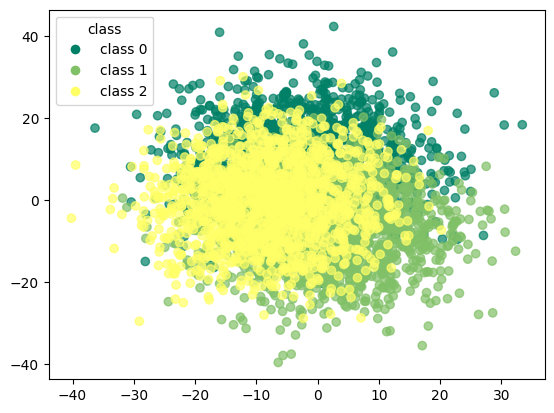

In [128]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

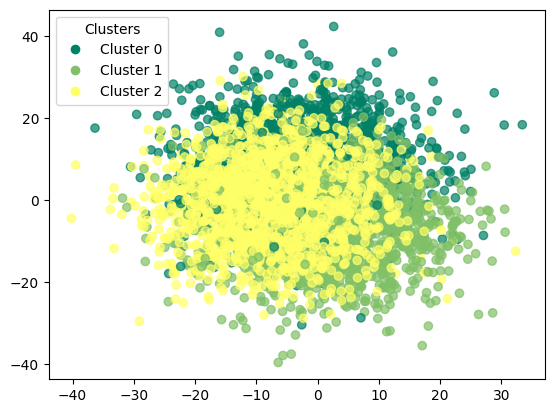

In [129]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

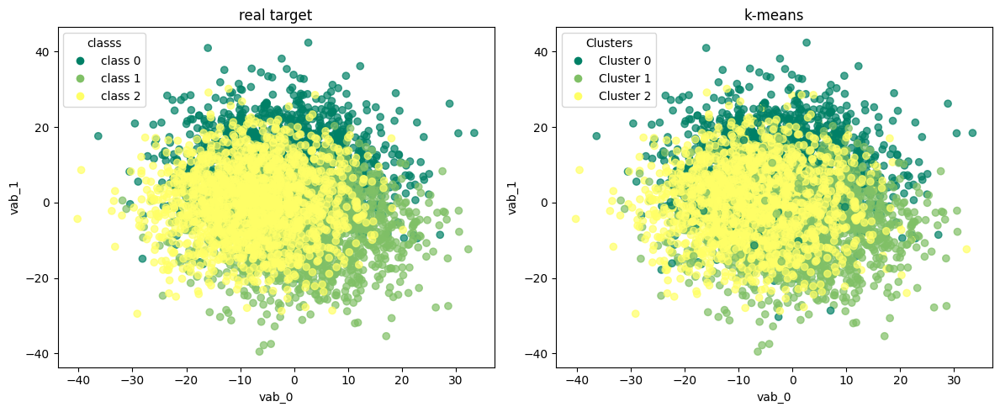

In [130]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

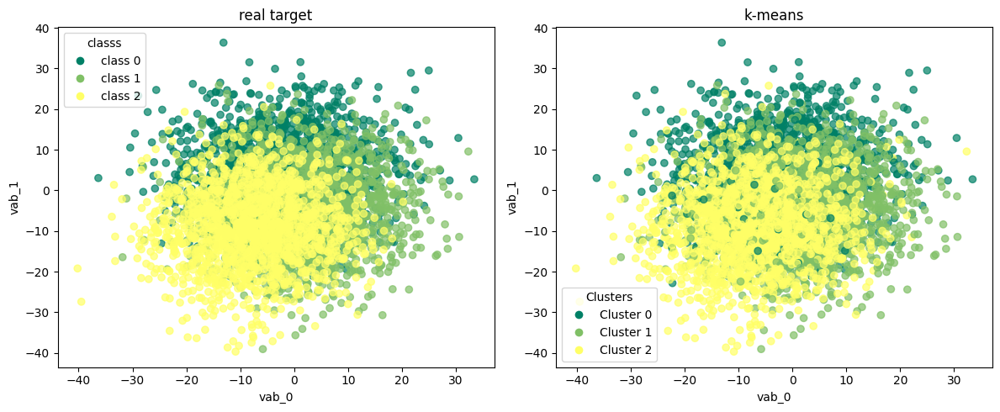

In [131]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [132]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=3,trim_fraction=0.1)

In [133]:
trim_kmeans_tsne

KMeans(n_clusters=3, random_state=42)

In [134]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [135]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [136]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [137]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,2
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,2
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,2
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,2
5,-15.000836,4.840861,15.945320,-6.485857,-6.189127,-10.250297,4.107853,10.769119,-0.139978,-3.584421,...,4.139756,-0.788152,2.782174,-20.417977,-4.088289,-8.929520,-4.608089,9.146845,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,0
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,1
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,1
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,1


In [138]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.03379279679857715
accuracy after: 0.9126278345931526


In [139]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
5,-15.000836,4.840861,15.945320,-6.485857,-6.189127,-10.250297,4.107853,10.769119,-0.139978,-3.584421,...,4.139756,-0.788152,2.782174,-20.417977,-4.088289,-8.929520,-4.608089,9.146845,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,1
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


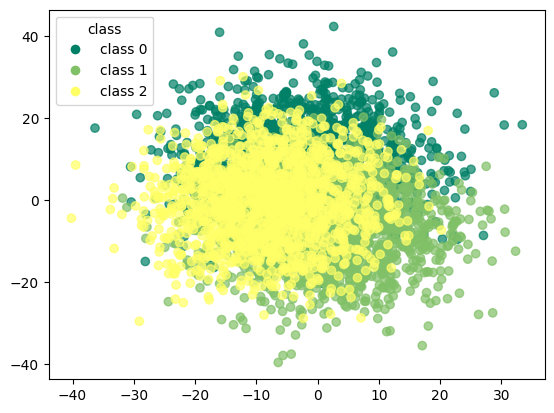

In [140]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

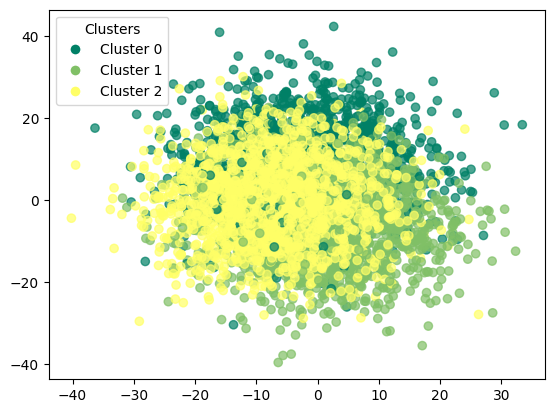

In [141]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

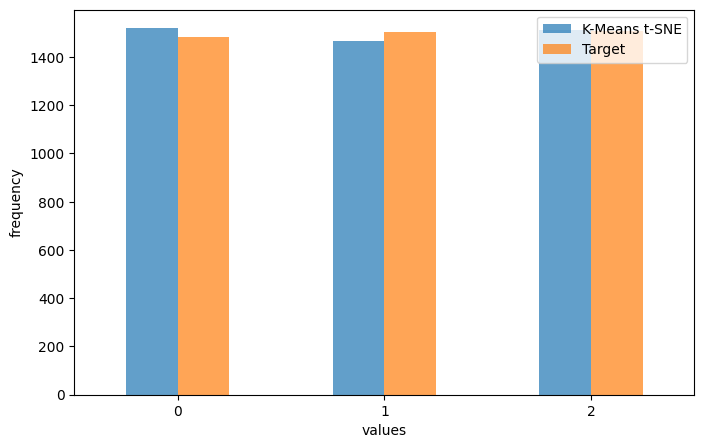

In [142]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [143]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[1416    4   64]
 [  59 1343  103]
 [  45  118 1346]]


In [144]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      1484
           1       0.92      0.89      0.90      1505
           2       0.89      0.89      0.89      1509

    accuracy                           0.91      4498
   macro avg       0.91      0.91      0.91      4498
weighted avg       0.91      0.91      0.91      4498



### trimmed k-means with umap

In [145]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=3,trim_fraction=0.1)

In [146]:
trim_kmeans_umap

KMeans(n_clusters=3, random_state=42)

In [147]:
df_umap_trim_kmeans = corr_dataset.copy()

In [148]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [149]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [150]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,1
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,1
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,1
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,1
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


In [151]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.30658070253445974
accuracy after: 0.9562027567807915


In [152]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


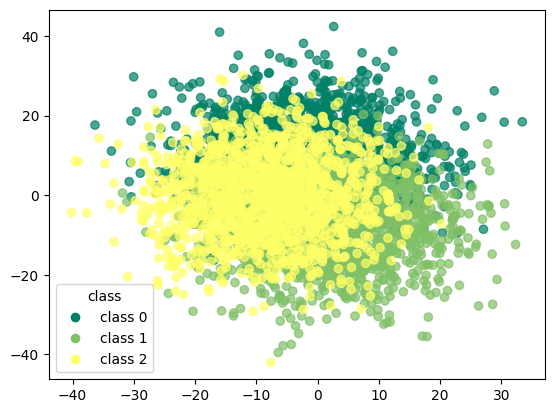

In [153]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

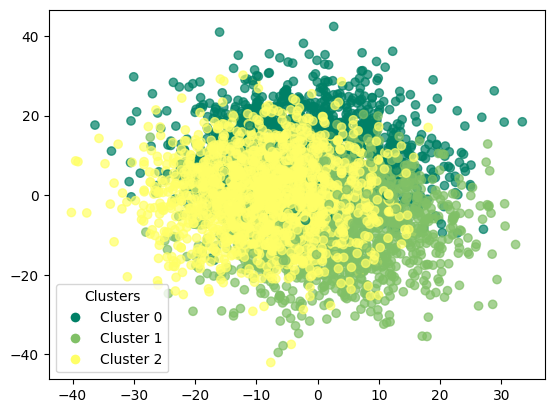

In [154]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

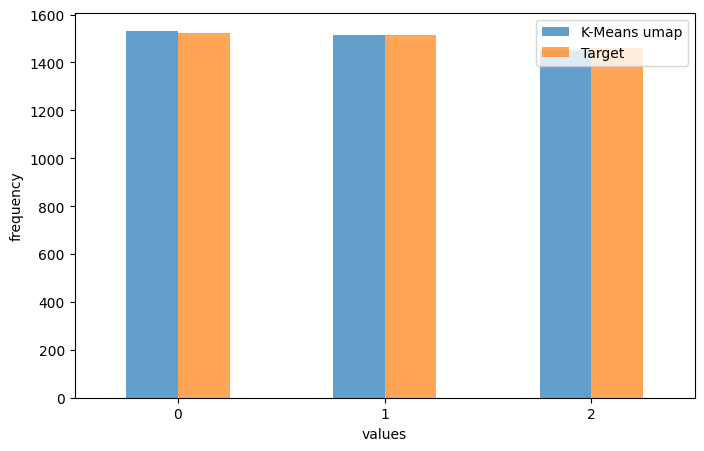

In [155]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [156]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1496    5   20]
 [   9 1440   67]
 [  26   70 1365]]


In [157]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1521
           1       0.95      0.95      0.95      1516
           2       0.94      0.93      0.94      1461

    accuracy                           0.96      4498
   macro avg       0.96      0.96      0.96      4498
weighted avg       0.96      0.96      0.96      4498



## dbscan

In [158]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

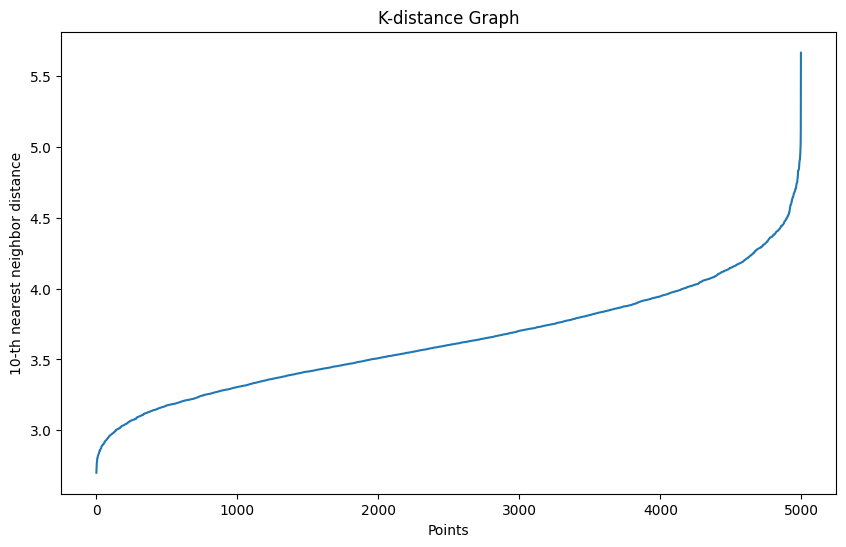

In [159]:
plot_k_distance_graph(X_values,k=10) 

In [160]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [161]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [162]:
df_dbscan = corr_dataset.copy()

In [163]:
df_dbscan['dbscan'] = dbscan.labels_

In [164]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [165]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,-1
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,-1
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,-1
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,-1
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,-1
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,-1
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,-1
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,-1


In [166]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    4998
Name: count, dtype: int64


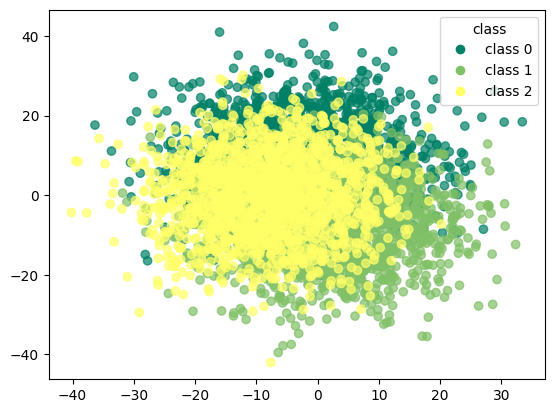

In [167]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

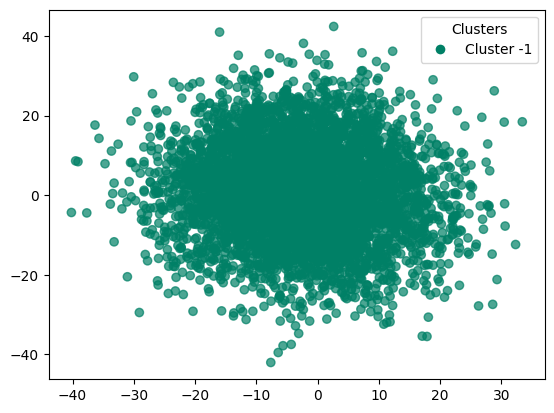

In [168]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [169]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]]


In [170]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1666.0
           1       0.00      0.00      0.00    1666.0
           2       0.00      0.00      0.00    1666.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



### dbscan with pca

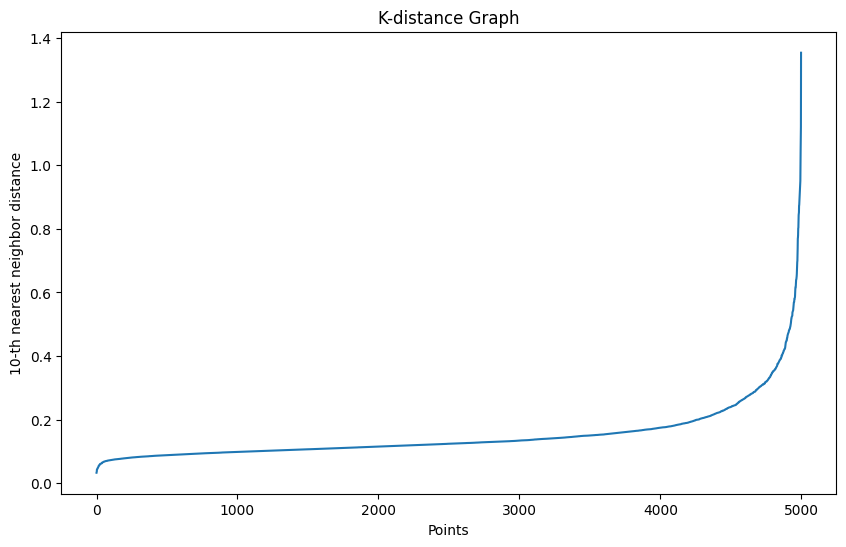

In [171]:
plot_k_distance_graph(X_pca,k=10)

In [172]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [173]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [174]:
df_pca_dbscan = corr_dataset.copy()

In [175]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [176]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.3287314925970388
accuracy after: 0.33053221288515405


In [177]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,1
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,1
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,1
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,1
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,1
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,1
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,1
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,1


In [178]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 1    4949
-1      49
Name: count, dtype: int64


In [179]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [  23    0 1643    0]
 [  14    0 1652    0]
 [  12    0 1654    0]]


In [180]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1666
           1       0.33      0.99      0.50      1666
           2       0.00      0.00      0.00      1666

    accuracy                           0.33      4998
   macro avg       0.08      0.25      0.12      4998
weighted avg       0.11      0.33      0.17      4998



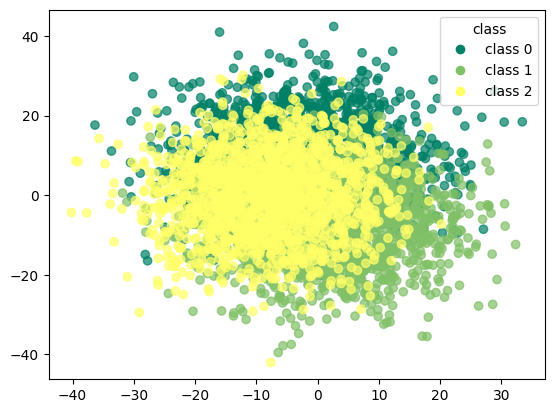

In [181]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

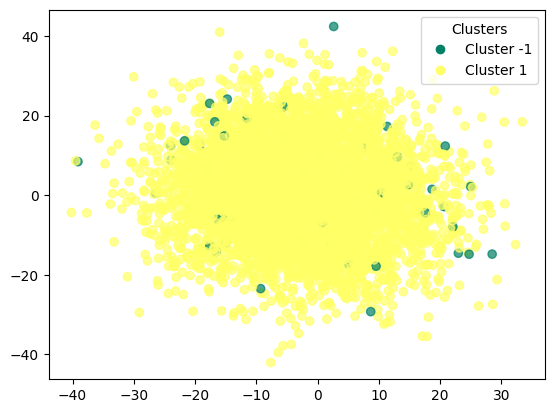

In [182]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

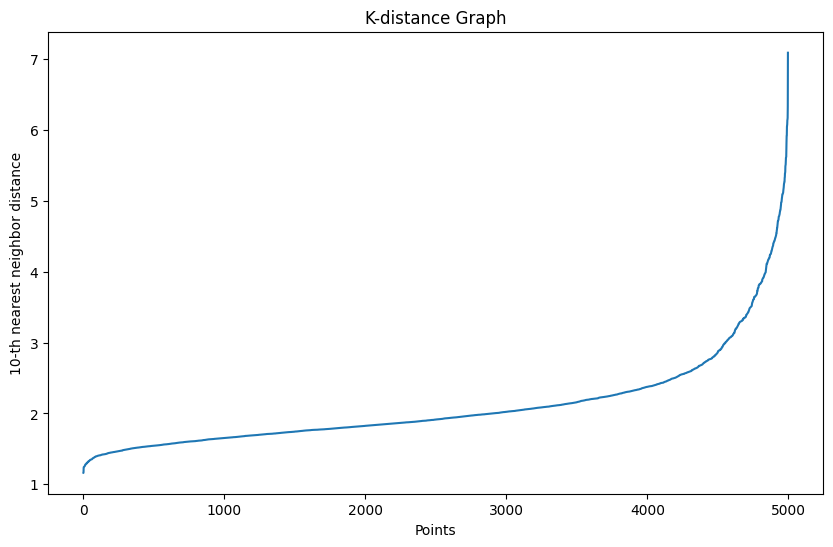

In [183]:
plot_k_distance_graph(X_tsne,k=10)

In [184]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [185]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [186]:
df_tsne_dbscan = corr_dataset.copy()

In [187]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [188]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.32232893157262904
accuracy after: 0.321328531412565


In [189]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,2
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,2
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,2
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,2
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


In [190]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
 2    4787
-1     204
 3       7
Name: count, dtype: int64


In [191]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0]
 [  62    0    0 1604    0]
 [  82    0    0 1577    7]
 [  60    0    0 1606    0]
 [   0    0    0    0    0]]


In [192]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1666
           1       0.00      0.00      0.00      1666
           2       0.34      0.96      0.50      1666
           3       0.00      0.00      0.00         0

    accuracy                           0.32      4998
   macro avg       0.07      0.19      0.10      4998
weighted avg       0.11      0.32      0.17      4998



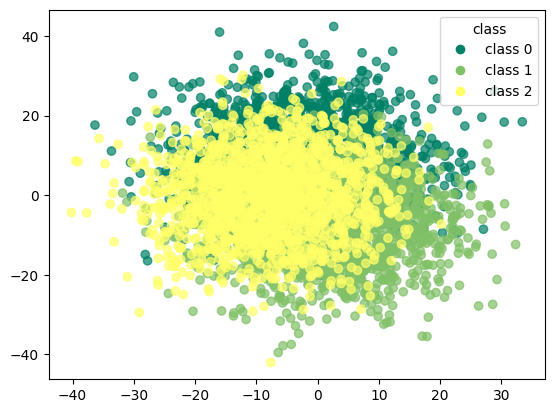

In [193]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

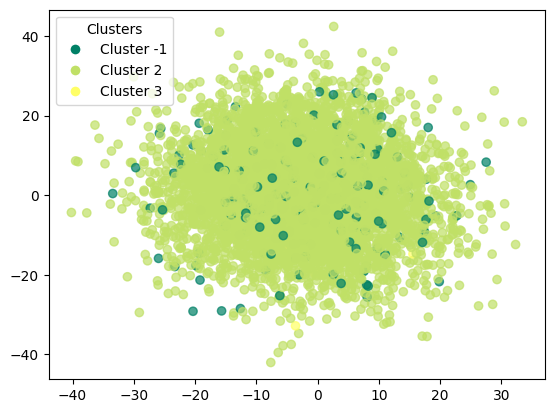

In [194]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

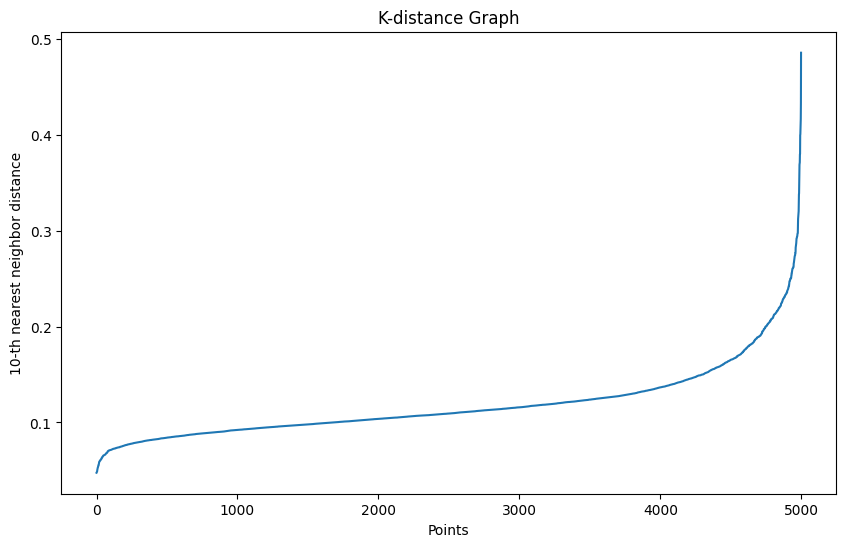

In [195]:
plot_k_distance_graph(X_umap,k=10)

In [196]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [197]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [198]:
df_umap_dbscan = corr_dataset.copy()

In [199]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [200]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 0.3333333333333333
accuracy after: 0.3333333333333333


In [201]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,0
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,0
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,0
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,0


In [202]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    4998
Name: count, dtype: int64


In [203]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1666    0    0]
 [1666    0    0]
 [1666    0    0]]


In [204]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       0.33      1.00      0.50      1666
           1       0.00      0.00      0.00      1666
           2       0.00      0.00      0.00      1666

    accuracy                           0.33      4998
   macro avg       0.11      0.33      0.17      4998
weighted avg       0.11      0.33      0.17      4998



## GMM - Gaussian Mixture Models

In [205]:
gmm = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [206]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [207]:
df_gmm = corr_dataset.copy()

In [208]:
df_gmm['gmm'] = gmm.predict(X_values)

In [209]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,2
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,2
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,2
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,2
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,1


In [210]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.32553021208483396
accuracy after: 0.6430572228891557


In [211]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,0
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,0
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,0
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


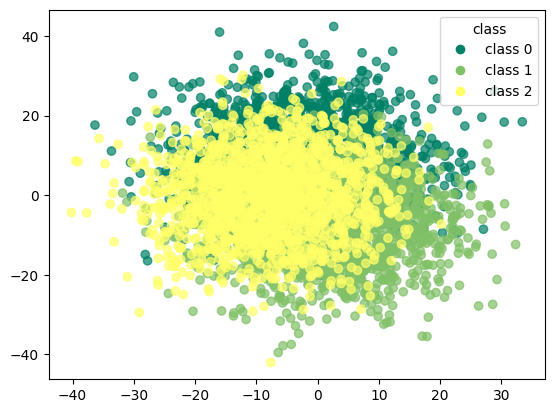

In [212]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

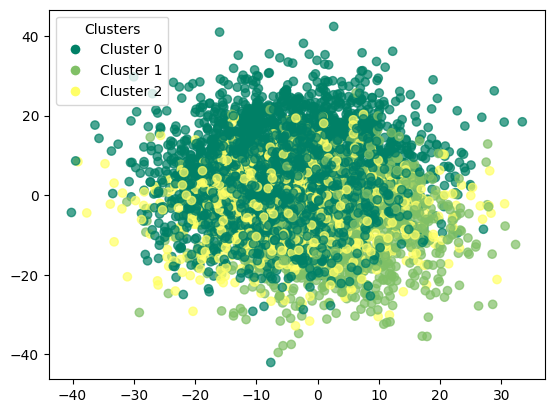

In [213]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [214]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1661    5    0]
 [  89 1168  409]
 [1213   68  385]]


In [215]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.56      1.00      0.72      1666
           1       0.94      0.70      0.80      1666
           2       0.48      0.23      0.31      1666

    accuracy                           0.64      4998
   macro avg       0.66      0.64      0.61      4998
weighted avg       0.66      0.64      0.61      4998



### GMM with pca

In [216]:
gmm_pca = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [217]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [218]:
df_pca_gmm = corr_dataset.copy()

In [219]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [220]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,2
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,2
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,2
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,2
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,1
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,1
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,1
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,1


In [221]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.05102040816326531
accuracy after: 0.930172068827531


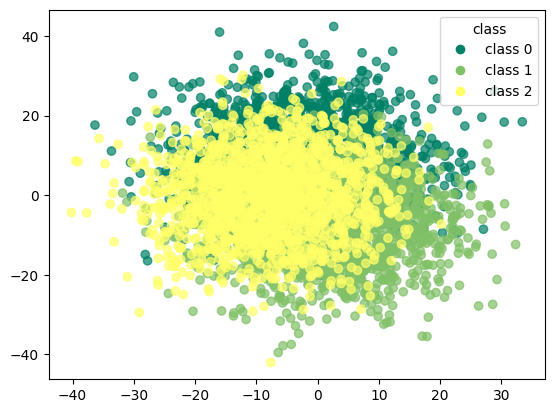

In [222]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

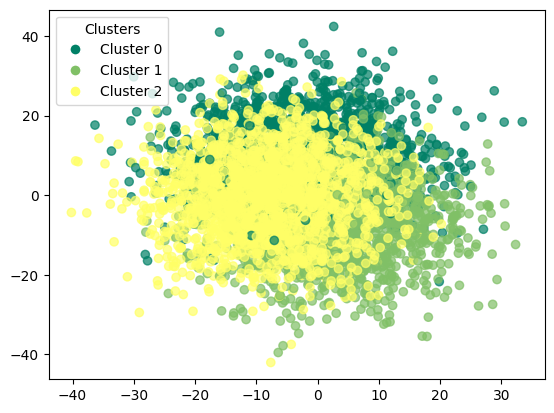

In [223]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [224]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1617   10   39]
 [  26 1440  200]
 [  45   29 1592]]


In [225]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1666
           1       0.97      0.86      0.92      1666
           2       0.87      0.96      0.91      1666

    accuracy                           0.93      4998
   macro avg       0.93      0.93      0.93      4998
weighted avg       0.93      0.93      0.93      4998



### GMM with t-SNE

In [226]:
gmm_tsne = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [227]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [228]:
df_tsne_gmm = corr_dataset.copy()

In [229]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [230]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,1
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,1
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,1
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,1
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


In [231]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.30012004801920766
accuracy after: 0.8739495798319328


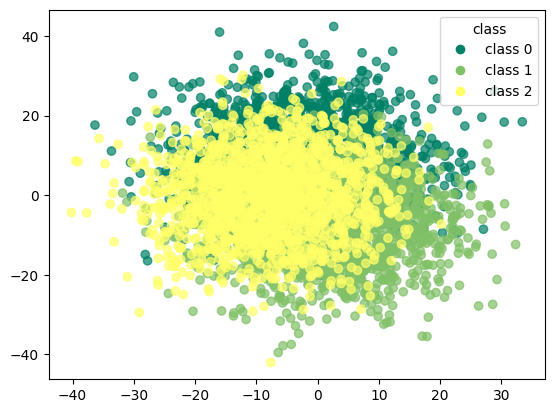

In [232]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

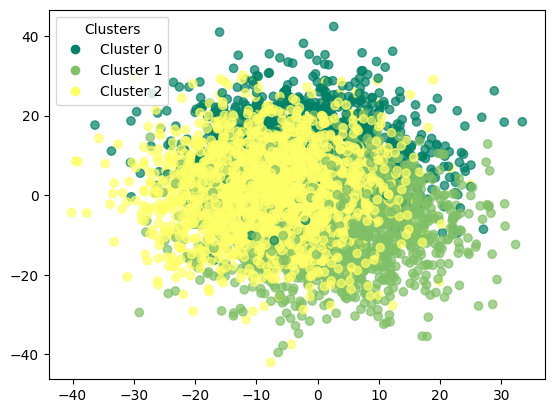

In [233]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [234]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1374   11  281]
 [  13 1518  135]
 [  20  170 1476]]


In [235]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.98      0.82      0.89      1666
           1       0.89      0.91      0.90      1666
           2       0.78      0.89      0.83      1666

    accuracy                           0.87      4998
   macro avg       0.88      0.87      0.88      4998
weighted avg       0.88      0.87      0.88      4998



### GMM with umap

In [236]:
gmm_umap = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [237]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [238]:
df_umap_gmm = corr_dataset.copy()

In [239]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [240]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,1
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,1
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,1
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,1
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


In [241]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.31212484993997597
accuracy after: 0.9257703081232493


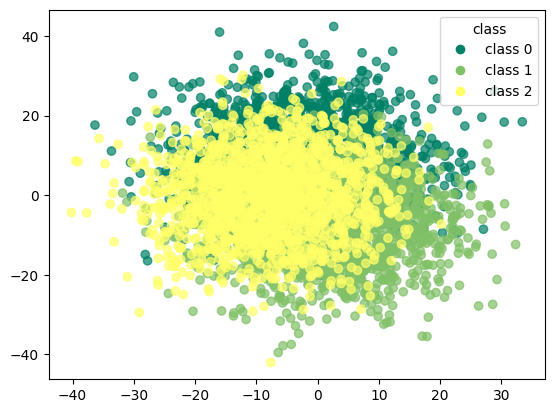

In [242]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

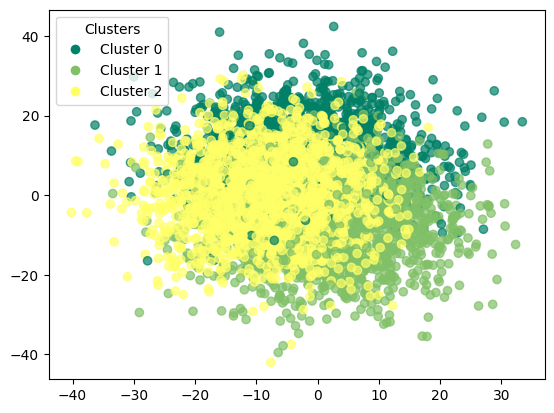

In [243]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [244]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1564   28   74]
 [  26 1557   83]
 [  36  124 1506]]


In [245]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1666
           1       0.91      0.93      0.92      1666
           2       0.91      0.90      0.90      1666

    accuracy                           0.93      4998
   macro avg       0.93      0.93      0.93      4998
weighted avg       0.93      0.93      0.93      4998



## pam

In [246]:
initial_medoids = np.random.choice(len(X_values),3,replace=False)

In [247]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [248]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [249]:
pam.process()

In [250]:
clusters = pam.get_clusters()

In [251]:
medoids = pam.get_medoids()

In [252]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [253]:
df_pam = corr_dataset.copy()

In [254]:
df_pam['pam'] = labels

In [255]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,2.0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,2.0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,2.0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,2.0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,0.0
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,0.0
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,0.0
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,1.0


In [256]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.3277310924369748
accuracy after: 0.8365346138455382


In [257]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,1


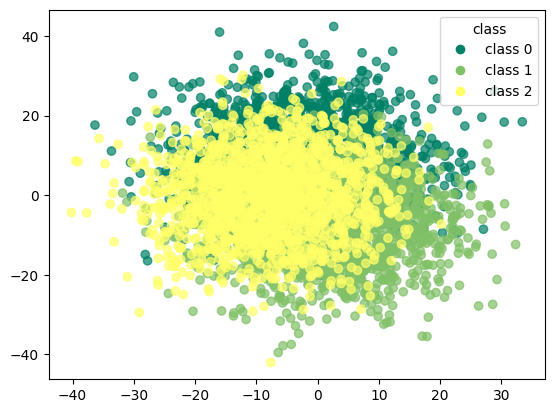

In [258]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

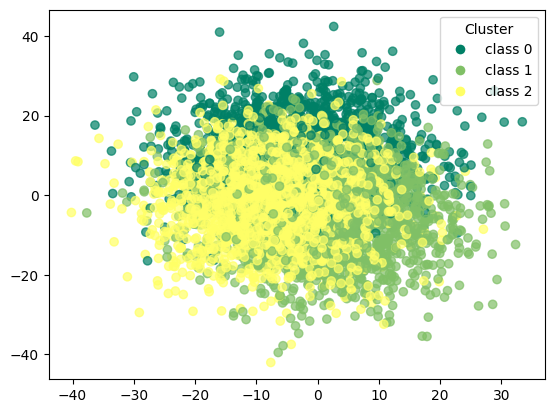

In [259]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [260]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1489   40  137]
 [  63 1422  181]
 [  79  317 1270]]


In [261]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.91      0.89      0.90      1666
           1       0.80      0.85      0.83      1666
           2       0.80      0.76      0.78      1666

    accuracy                           0.84      4998
   macro avg       0.84      0.84      0.84      4998
weighted avg       0.84      0.84      0.84      4998



### pam with pca

In [262]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [263]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [264]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [265]:
pam_pca.process()

In [266]:
clusters = pam_pca.get_clusters()

In [267]:
medoids = pam_pca.get_medoids()

In [268]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [269]:
df_pam_pca = corr_dataset.copy()

In [270]:
df_pam_pca['pam_pca'] = labels

In [271]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,1.0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,1.0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,1.0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,1.0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,0.0
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,0.0
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,0.0
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,0.0


In [272]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.03041216486594638
accuracy after: 0.9415766306522609


In [273]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


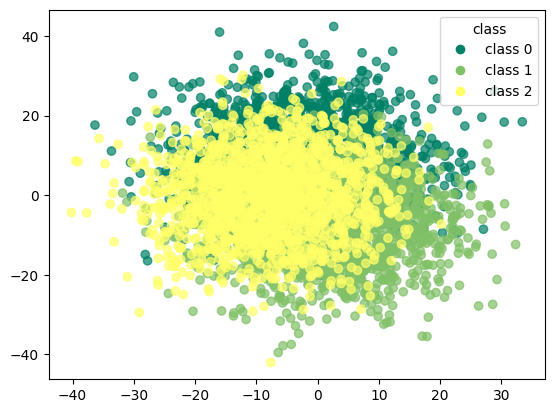

In [274]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

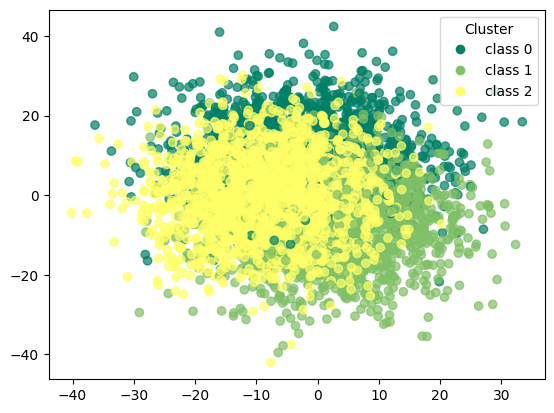

In [275]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [276]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1614   13   39]
 [  29 1553   84]
 [  43   84 1539]]


In [277]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1666
           1       0.94      0.93      0.94      1666
           2       0.93      0.92      0.92      1666

    accuracy                           0.94      4998
   macro avg       0.94      0.94      0.94      4998
weighted avg       0.94      0.94      0.94      4998



### pam with t-SNE

In [278]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [279]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [280]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [281]:
pam_tsne.process()

In [282]:
clusters = pam_tsne.get_clusters()

In [283]:
medoids = pam_tsne.get_medoids()

In [284]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [285]:
df_pam_tsne = corr_dataset.copy()

In [286]:
df_pam_tsne['pam_tsne'] = labels

In [287]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0.0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0.0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0.0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0.0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2.0
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2.0
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2.0
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2.0


In [288]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.9051620648259304
accuracy after: 0.9051620648259304


In [289]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


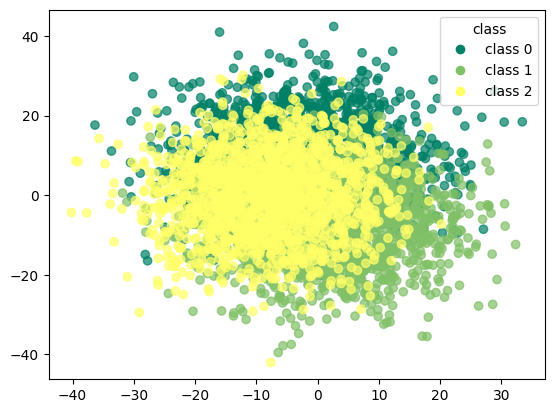

In [290]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

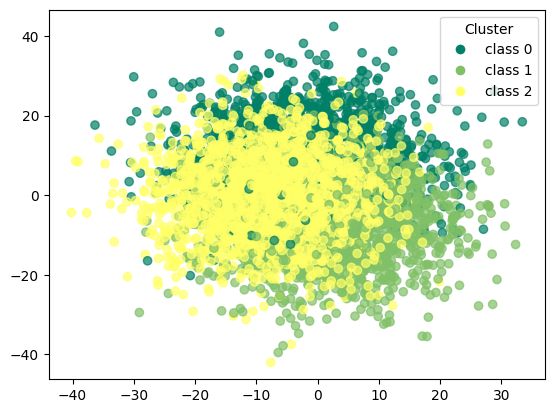

In [291]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [292]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1568    8   90]
 [  36 1474  156]
 [  63  121 1482]]


In [293]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1666
           1       0.92      0.88      0.90      1666
           2       0.86      0.89      0.87      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



### pam with umap

In [294]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [295]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [296]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [297]:
pam_umap.process()

In [298]:
clusters = pam_umap.get_clusters()

In [299]:
medoids = pam_umap.get_medoids()

In [300]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [301]:
df_pam_umap = corr_dataset.copy()

In [302]:
df_pam_umap['pam_umap'] = labels

In [303]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,1.0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,1.0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,1.0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,1.0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2.0
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2.0
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2.0
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2.0


In [304]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.31452581032412963
accuracy after: 0.9287715086034414


In [305]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,12.499951,11.636812,0.547989,15.207728,-2.191925,-2.098685,3.803046,3.553764,8.198680,-0.628367,...,9.958399,1.736541,-8.007322,-2.982284,-27.663831,3.776849,-14.600173,5.171086,0,0
1,5.094330,-1.264779,-1.451186,14.773039,5.818212,-3.165080,-14.459003,-11.180130,7.922276,-4.501496,...,3.724540,-4.220641,6.313043,-8.843247,-11.412887,5.876371,-3.703718,-3.163892,0,0
2,7.076673,-2.223127,9.575647,-5.286593,-11.231732,-6.370482,-10.268947,-9.518311,16.785241,15.213425,...,0.937937,-15.971816,-5.043410,-17.695158,0.957229,-6.771935,-17.651127,-39.902526,0,0
3,-3.564518,10.796602,17.371078,-14.653553,2.315384,-11.282432,-8.103460,8.439334,0.402816,-15.517036,...,17.150946,-0.279059,-6.734431,-20.376423,1.643501,0.130306,0.308485,-0.505678,0,0
4,-2.011398,4.444182,-5.479839,2.164205,8.491728,-18.433565,1.199828,15.483875,-16.027888,9.637596,...,26.409487,3.821151,-15.460312,-0.098024,-13.612443,-7.837850,0.163957,8.013314,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,-12.144705,-10.162444,-0.910422,29.673423,11.373097,8.018177,-3.437894,3.256411,16.482052,1.663349,...,4.844341,19.951217,-9.557569,14.237568,-7.876153,15.818749,-13.727722,-11.313606,2,2
4994,-13.372148,4.740324,-13.348653,0.252341,-12.016011,-0.303023,-2.552817,-1.748497,4.214129,-10.101644,...,22.851648,16.269693,-2.400144,7.599585,-15.001977,-4.426985,-10.128912,-3.804226,2,2
4995,-16.340854,10.420605,11.597087,-1.707101,-4.100284,0.150719,-11.369492,-9.700086,3.074730,3.545409,...,30.539492,25.143125,-1.812302,24.245786,-20.931859,-7.886583,-12.690158,-11.538916,2,2
4996,1.575806,12.083526,-3.985152,-0.528416,18.829196,22.722443,-2.190185,3.900971,13.824632,-13.420323,...,-1.629438,-6.997005,5.960282,-3.162030,-2.720310,5.266805,-5.890755,-21.778165,2,2


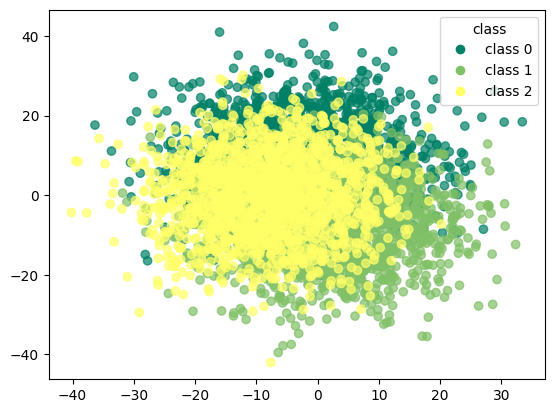

In [306]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

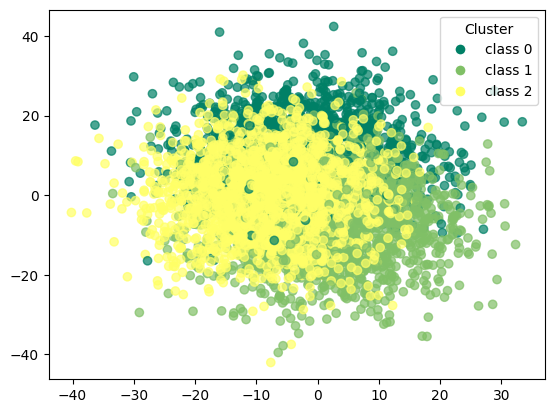

In [307]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [308]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1582   24   60]
 [  28 1540   98]
 [  47   99 1520]]


In [309]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1666
           1       0.93      0.92      0.93      1666
           2       0.91      0.91      0.91      1666

    accuracy                           0.93      4998
   macro avg       0.93      0.93      0.93      4998
weighted avg       0.93      0.93      0.93      4998



# overall results k-means

## basic

In [310]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1666
           1       0.94      0.94      0.94      1666
           2       0.94      0.92      0.93      1666

    accuracy                           0.94      4998
   macro avg       0.94      0.94      0.94      4998
weighted avg       0.94      0.94      0.94      4998



In [311]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1620   15   31]
 [  28 1565   73]
 [  49   90 1527]]


## + pca

In [312]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1666
           1       0.94      0.94      0.94      1666
           2       0.93      0.92      0.92      1666

    accuracy                           0.94      4998
   macro avg       0.94      0.94      0.94      4998
weighted avg       0.94      0.94      0.94      4998



In [313]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1620   14   32]
 [  28 1559   79]
 [  47   94 1525]]


## + t-SNE

In [314]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1666
           1       0.91      0.89      0.90      1666
           2       0.86      0.88      0.87      1666

    accuracy                           0.90      4998
   macro avg       0.90      0.90      0.90      4998
weighted avg       0.90      0.90      0.90      4998



In [315]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1564    8   94]
 [  36 1483  147]
 [  59  135 1472]]


## + UMAP

In [316]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.96      0.95      0.95      1666
           1       0.93      0.93      0.93      1666
           2       0.91      0.91      0.91      1666

    accuracy                           0.93      4998
   macro avg       0.93      0.93      0.93      4998
weighted avg       0.93      0.93      0.93      4998



In [317]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1582   24   60]
 [  28 1543   95]
 [  45  100 1521]]


# overall results trimmed k-means

## basic

In [318]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      1484
           1       0.94      0.95      0.94      1505
           2       0.94      0.91      0.93      1509

    accuracy                           0.94      4498
   macro avg       0.94      0.94      0.94      4498
weighted avg       0.94      0.94      0.94      4498



In [319]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1446   13   25]
 [  21 1423   61]
 [  44   85 1380]]


## + pca

In [320]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1484
           1       0.93      0.93      0.93      1505
           2       0.92      0.92      0.92      1509

    accuracy                           0.94      4498
   macro avg       0.94      0.94      0.94      4498
weighted avg       0.94      0.94      0.94      4498



In [321]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1434   26   24]
 [   9 1405   91]
 [  39   86 1384]]


## + t-SNE

In [322]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      1484
           1       0.92      0.89      0.90      1505
           2       0.89      0.89      0.89      1509

    accuracy                           0.91      4498
   macro avg       0.91      0.91      0.91      4498
weighted avg       0.91      0.91      0.91      4498



In [323]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[1416    4   64]
 [  59 1343  103]
 [  45  118 1346]]


## + UMAP

In [324]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1521
           1       0.95      0.95      0.95      1516
           2       0.94      0.93      0.94      1461

    accuracy                           0.96      4498
   macro avg       0.96      0.96      0.96      4498
weighted avg       0.96      0.96      0.96      4498



In [325]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[1496    5   20]
 [   9 1440   67]
 [  26   70 1365]]


# overall results dbscan

## basic

In [326]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1666.0
           1       0.00      0.00      0.00    1666.0
           2       0.00      0.00      0.00    1666.0

    accuracy                           0.00    4998.0
   macro avg       0.00      0.00      0.00    4998.0
weighted avg       0.00      0.00      0.00    4998.0



In [327]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]
 [1666    0    0    0]]


## + pca

In [328]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1666
           1       0.33      0.99      0.50      1666
           2       0.00      0.00      0.00      1666

    accuracy                           0.33      4998
   macro avg       0.08      0.25      0.12      4998
weighted avg       0.11      0.33      0.17      4998



In [329]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0]
 [  23    0 1643    0]
 [  14    0 1652    0]
 [  12    0 1654    0]]


## + t-SNE

In [330]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1666
           1       0.00      0.00      0.00      1666
           2       0.34      0.96      0.50      1666
           3       0.00      0.00      0.00         0

    accuracy                           0.32      4998
   macro avg       0.07      0.19      0.10      4998
weighted avg       0.11      0.32      0.17      4998



In [331]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0]
 [  62    0    0 1604    0]
 [  82    0    0 1577    7]
 [  60    0    0 1606    0]
 [   0    0    0    0    0]]


## + UMAP

In [332]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       0.33      1.00      0.50      1666
           1       0.00      0.00      0.00      1666
           2       0.00      0.00      0.00      1666

    accuracy                           0.33      4998
   macro avg       0.11      0.33      0.17      4998
weighted avg       0.11      0.33      0.17      4998



In [333]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1666    0    0]
 [1666    0    0]
 [1666    0    0]]


# overall results GMM

## basic

In [334]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.56      1.00      0.72      1666
           1       0.94      0.70      0.80      1666
           2       0.48      0.23      0.31      1666

    accuracy                           0.64      4998
   macro avg       0.66      0.64      0.61      4998
weighted avg       0.66      0.64      0.61      4998



In [335]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1661    5    0]
 [  89 1168  409]
 [1213   68  385]]


## + pca

In [336]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1666
           1       0.97      0.86      0.92      1666
           2       0.87      0.96      0.91      1666

    accuracy                           0.93      4998
   macro avg       0.93      0.93      0.93      4998
weighted avg       0.93      0.93      0.93      4998



In [337]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1617   10   39]
 [  26 1440  200]
 [  45   29 1592]]


## + t-SNE

In [338]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.98      0.82      0.89      1666
           1       0.89      0.91      0.90      1666
           2       0.78      0.89      0.83      1666

    accuracy                           0.87      4998
   macro avg       0.88      0.87      0.88      4998
weighted avg       0.88      0.87      0.88      4998



In [339]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1374   11  281]
 [  13 1518  135]
 [  20  170 1476]]


## + UMAP

In [340]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1666
           1       0.91      0.93      0.92      1666
           2       0.91      0.90      0.90      1666

    accuracy                           0.93      4998
   macro avg       0.93      0.93      0.93      4998
weighted avg       0.93      0.93      0.93      4998



In [341]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1564   28   74]
 [  26 1557   83]
 [  36  124 1506]]


# overall results pam

## basic

In [342]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1489   40  137]
 [  63 1422  181]
 [  79  317 1270]]


In [343]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.91      0.89      0.90      1666
           1       0.80      0.85      0.83      1666
           2       0.80      0.76      0.78      1666

    accuracy                           0.84      4998
   macro avg       0.84      0.84      0.84      4998
weighted avg       0.84      0.84      0.84      4998



## + pca

In [344]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1614   13   39]
 [  29 1553   84]
 [  43   84 1539]]


In [345]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1666
           1       0.94      0.93      0.94      1666
           2       0.93      0.92      0.92      1666

    accuracy                           0.94      4998
   macro avg       0.94      0.94      0.94      4998
weighted avg       0.94      0.94      0.94      4998



## + t-SNE

In [346]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1568    8   90]
 [  36 1474  156]
 [  63  121 1482]]


In [347]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1666
           1       0.92      0.88      0.90      1666
           2       0.86      0.89      0.87      1666

    accuracy                           0.91      4998
   macro avg       0.91      0.91      0.91      4998
weighted avg       0.91      0.91      0.91      4998



## + umap

In [348]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1582   24   60]
 [  28 1540   98]
 [  47   99 1520]]


In [349]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1666
           1       0.93      0.92      0.93      1666
           2       0.91      0.91      0.91      1666

    accuracy                           0.93      4998
   macro avg       0.93      0.93      0.93      4998
weighted avg       0.93      0.93      0.93      4998

